**Histopathology Image Classification using Deep Learning**

Classifying histopathology tissue images using CNNs, Attention-based CNNs, Vision Transformers, and Transfer Learning (ResNet50 & DenseNet121).  
Includes per-class evaluation, confusion matrices, class-wise loss, and visualization of sample predictions.

---

## Models Overview

| Model | Description | Epochs | Train Loss | Val Loss | Val Accuracy |
|-------|-------------|--------|------------|----------|--------------|
| CNN (Scratch) | Baseline CNN with 3 convolutional blocks, adaptive pooling, and fully connected layers. | 20 | 0.6679 | 0.7148 | 68.27% |
| Attention + CNN | CNN enhanced with attention mechanism to focus on relevant regions. | 20 | 0.6298 | 0.6508 | 72.27% |
| Vision Transformer (ViT) | Images divided into patches, processed with self-attention for global context. | 20 | 0.0106 | 0.1550 | 95.87% |
| Transfer Learning (ResNet50) | Pretrained ResNet50, early layers frozen, fine-tuned on our dataset. | 20 | 0.2457 | 0.2587 | 92.27% |
| Transfer Learning (DenseNet121) | Pretrained DenseNet121 with dense connections for feature reuse, fine-tuned on dataset. | 20 | 0.2741 | 0.2711 | 91.60% |


In [ ]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as patches
import random
from sklearn.utils import shuffle
from glob import glob
import seaborn as sns

import torch
import torchvision.models as models
from torchvision import datasets, transforms
from torch import optim
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data.sampler import SubsetRandomSampler
import random
from sklearn.metrics import confusion_matrix
import itertools

from sklearn.model_selection import train_test_split
import matplotlib.patches as patches
from PIL import Image
import tensorflow_datasets as tfds

In [ ]:
data_set,ds_info=tfds.load("colorectal_histology",with_info=True,as_supervised=True)
train_ds=data_set["train"]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/colorectal_histology/incomplete.ZE4G78_2.0.0/colorectal_histology-train.tf…

Dataset colorectal_histology downloaded and prepared to /root/tensorflow_datasets/colorectal_histology/2.0.0. Subsequent calls will reuse this data.


In [ ]:
# Get labels of all classes in this dataset
img_labels = ds_info.features['label'].names

print(
    'There are {} classes in this dataset:\n{}'.format(
        len(img_labels),
        img_labels
    )
)


There are 8 classes in this dataset:
['tumor', 'stroma', 'complex', 'lympho', 'debris', 'mucosa', 'adipose', 'empty']


In [ ]:
from collections import Counter
# Extract all labels
labels = [label.numpy() for _, label in data_set['train']]

# Count each class
label_counts = Counter(labels)

for i in range(len(img_labels)):
    print('Number of images for {} category: {}'.format(img_labels[i], label_counts[i])
    )

Number of images for tumor category: 625
Number of images for stroma category: 625
Number of images for complex category: 625
Number of images for lympho category: 625
Number of images for debris category: 625
Number of images for mucosa category: 625
Number of images for adipose category: 625
Number of images for empty category: 625


In [ ]:
for img,label in train_ds.take(1):
    img=img.numpy()
    print(img.shape)
    print(label.numpy())

(150, 150, 3)
4


#  Short Overview of Colorectal Histology Dataset

1. **Dataset size & distribution**  
   - Total images: **5000**  
   - Classes: **8**  
   - Images per class: **625**  
   - Distribution: **evenly distributed**

2. **Task type**  
   - **Multiclass classification** (8 classes)

3. **Class details**

| Label | Code       | Description |
|-------|------------|-------------|
| 0     | 01_TUMOR   | Tumour epithelium |
| 1     | 02_STROMA  | Simple stroma (homogeneous composition, includes tumour stroma, extra-tumoural stroma, and smooth muscle) |
| 2     | 03_COMPLEX | Complex stroma (containing single tumour cells and/or few immune cells) |
| 3     | 04_LYMPHO  | Immune cells (including immune-cell conglomerates and sub-mucosal lymphoid follicles) |
| 4     | 05_DEBRIS  | Debris (including necrosis, hemorrhage, and mucus) |
| 5     | 06_MUCOSA  | Normal mucosal glands |
| 6     | 07_ADIPOSE | Adipose tissue |
| 7     | 08_EMPTY   | Background (no tissue) |

4. **Image properties**  
   - Size: **150 × 150 pixels**  
   - Mode: **RGB**


# Visualize 8 images per class

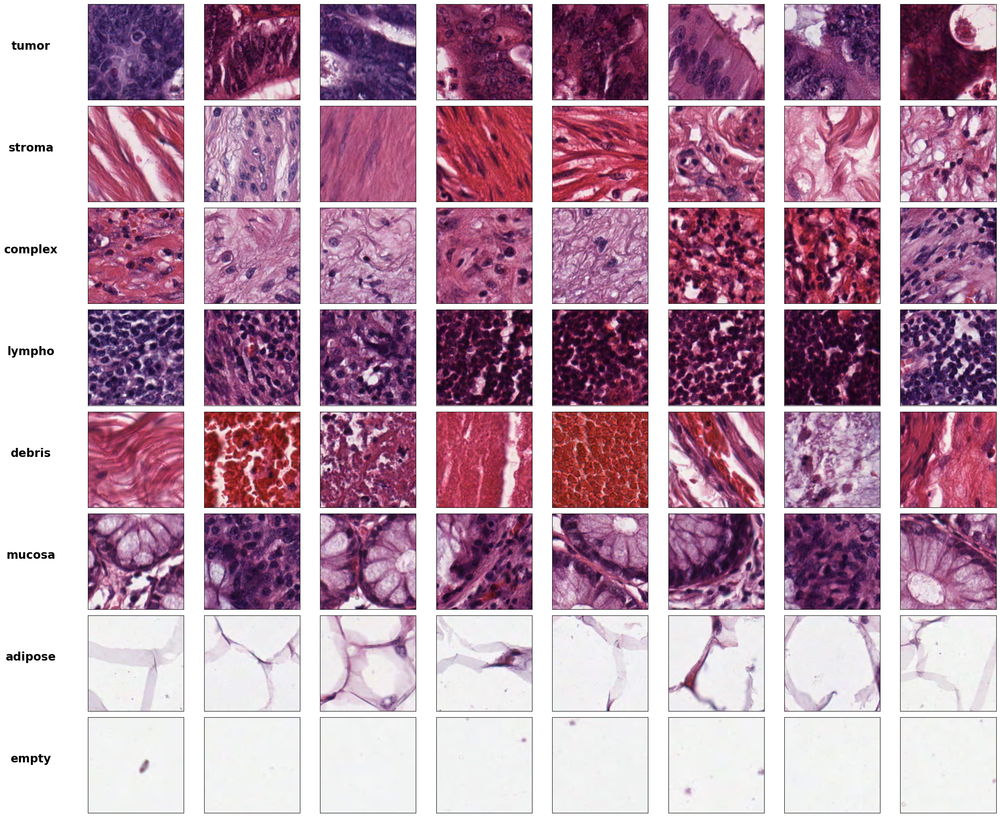

In [ ]:
class_images = {i: [] for i in range(len(ds_info.features['label'].names))}

# Take 8 images per class
for img, label in data_set['train']:
    label = label.numpy()
    if len(class_images[label]) < 8:
        class_images[label].append(img.numpy())

    if all(len(v) == 8 for v in class_images.values()):
        break
fig = plt.figure(figsize=(25, 20))

for i, class_name in enumerate(ds_info.features['label'].names):
    for j, img_np in enumerate(class_images[i]):
        ax = fig.add_subplot(8, 8, i*8 + j + 1, xticks=[], yticks=[])
        ax.imshow(img_np.astype("uint8"))
        if j == 0:
            ax.set_ylabel(class_name, rotation=0, labelpad=100, fontsize=20, fontweight='bold')

plt.tight_layout()
plt.show()

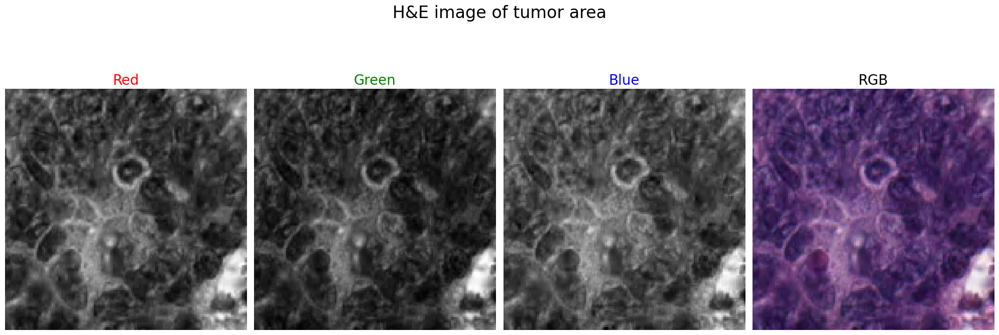

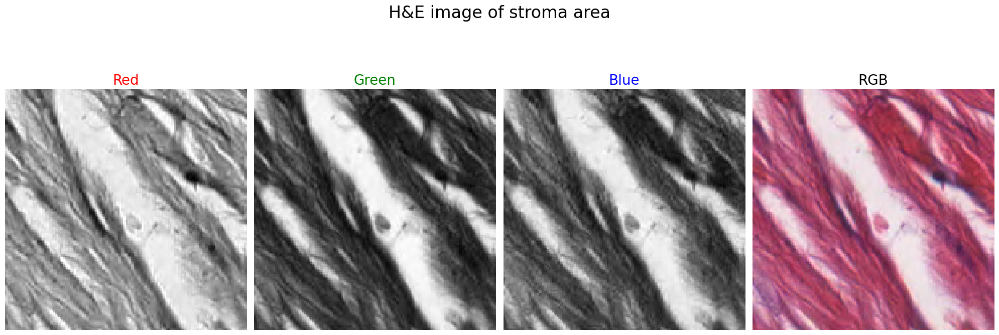

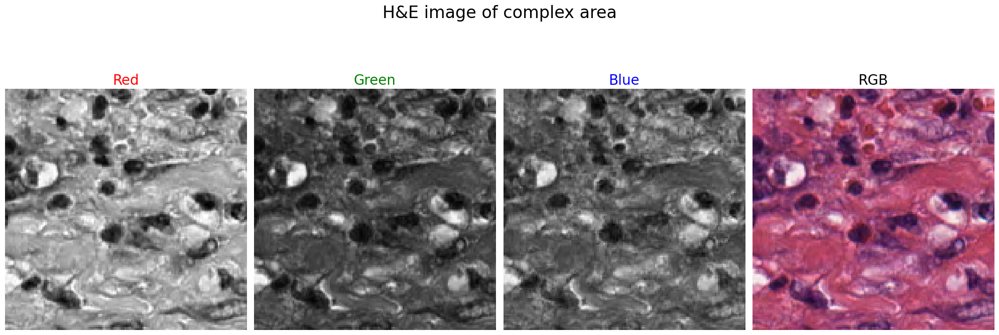

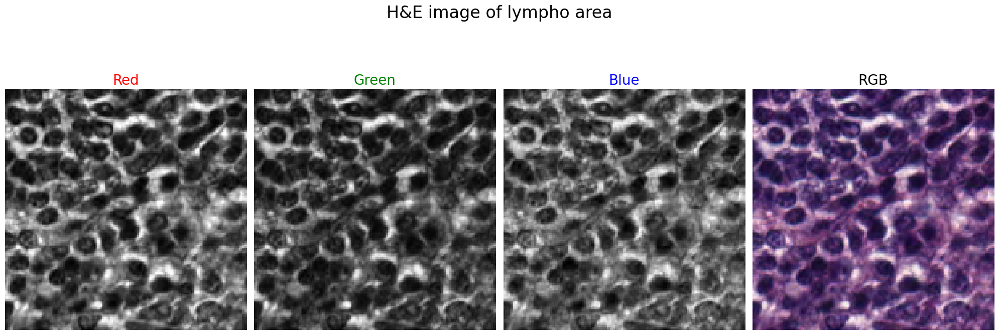

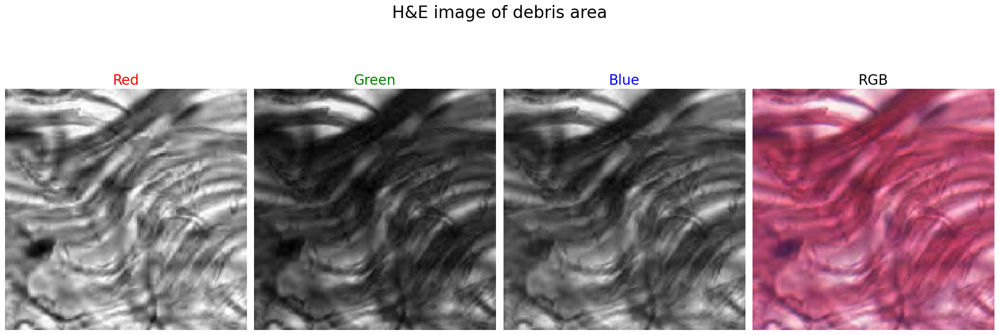

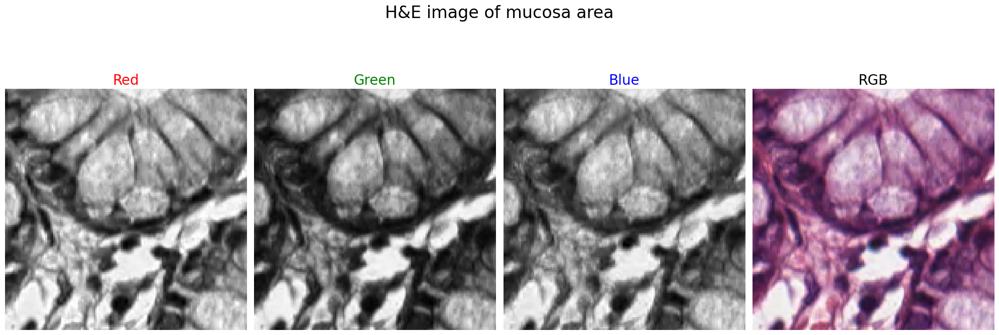

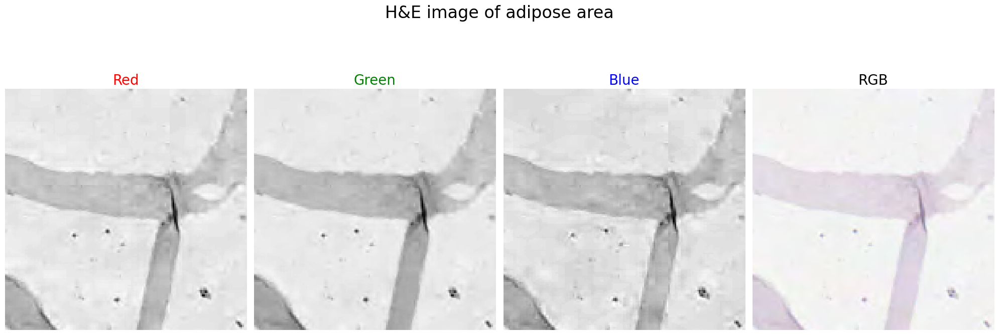

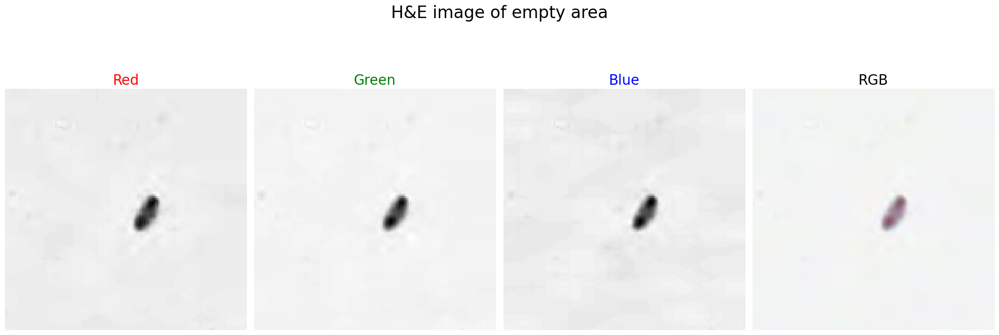

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plotImage_rgb_tfds(imgs, img_label):
    """
    Plot first image in RGB channels separately and combined
    imgs: list of TFDS images (NumPy arrays)
    img_label: string, class name
    """
    img_rgb = imgs[0]

    fig = plt.figure(figsize=(20,8))
    channels = ['Red', 'Green', 'Blue']
    colors = ['r','g','b']

    for idx in range(3):
        plt.subplot(1,4,idx+1)
        img = img_rgb[:,:,idx]
        plt.imshow(img, cmap='gray')
        plt.title(channels[idx], color=colors[idx], fontsize=20)
        plt.axis('off')

    plt.subplot(1,4,4)
    plt.imshow(img_rgb.astype("uint8"))
    plt.title('RGB', fontsize=20)
    plt.axis('off')

    fig.suptitle('H&E image of {} area'.format(img_label), fontsize=24)
    plt.tight_layout()
    plt.show()



for i, class_name in enumerate(ds_info.features['label'].names):
    plotImage_rgb_tfds(class_images[i], class_name)


     class  num_images      R_mean      G_mean      B_mean      R_std  \
0    tumor           8  112.445633   60.036017  101.141817  52.998102   
1   stroma           8  177.847444  100.043311  132.577539  39.690283   
2  complex           8  159.504044   92.255861  130.246006  47.655821   
3   lympho           8   94.015883   47.703978   87.738478  53.514803   
4   debris           8  167.262017   84.281422  109.395278  43.107706   
5   mucosa           8  133.755433   82.289078  123.799661  55.093095   
6  adipose           8  231.651844  225.720056  231.589661  23.428805   
7    empty           8  242.288144  243.294644  242.633144   3.831763   

       G_std      B_std  
0  53.960874  48.367133  
1  51.900572  47.570609  
2  47.456487  45.815425  
3  44.190417  45.492416  
4  54.168692  54.889243  
5  55.262103  48.470115  
6  32.401949  23.829939  
7   5.086967   4.257480  


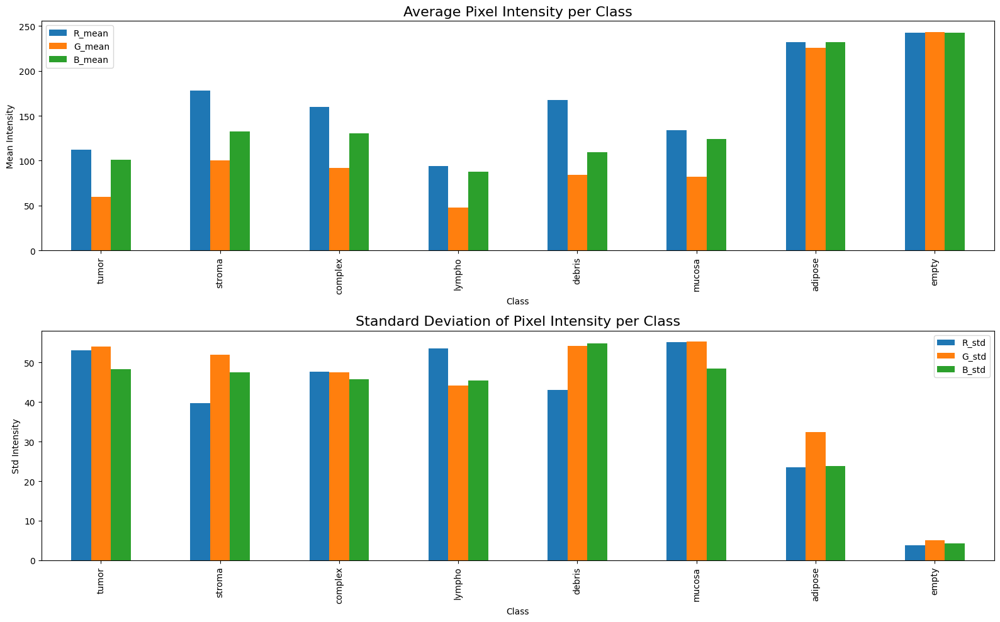

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


stats_data = []

for i, class_name in enumerate(ds_info.features['label'].names):
    imgs = np.array(class_images[i])
    n_imgs = len(imgs)
    r_mean = imgs[:,:,:,:].reshape(-1,3)[:,0].mean()
    g_mean = imgs[:,:,:,:].reshape(-1,3)[:,1].mean()
    b_mean = imgs[:,:,:,:].reshape(-1,3)[:,2].mean()

    r_std = imgs[:,:,:,:].reshape(-1,3)[:,0].std()
    g_std = imgs[:,:,:,:].reshape(-1,3)[:,1].std()
    b_std = imgs[:,:,:,:].reshape(-1,3)[:,2].std()

    stats_data.append({
        'class': class_name,
        'num_images': n_imgs,
        'R_mean': r_mean, 'G_mean': g_mean, 'B_mean': b_mean,
        'R_std': r_std, 'G_std': g_std, 'B_std': b_std
    })

stats_df = pd.DataFrame(stats_data)


print(stats_df)


fig, axes = plt.subplots(2,1, figsize=(16,10))

# Average intensity per class
stats_df.plot(x='class', y=['R_mean','G_mean','B_mean'], kind='bar', ax=axes[0])
axes[0].set_title('Average Pixel Intensity per Class', fontsize=16)
axes[0].set_ylabel('Mean Intensity')
axes[0].set_xlabel('Class')

# Std intensity per class
stats_df.plot(x='class', y=['R_std','G_std','B_std'], kind='bar', ax=axes[1])
axes[1].set_title('Standard Deviation of Pixel Intensity per Class', fontsize=16)
axes[1].set_ylabel('Std Intensity')
axes[1].set_xlabel('Class')

plt.tight_layout()
plt.show()


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Wrap TFDS dataset into PyTorch Dataset

In [ ]:
from torch.utils.data import Dataset
class TFDSDataset(Dataset):
    def __init__(self, tfds_split, transform=None):
        self.data = list(tfds_split)  # list of (image, label) tuples
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image, label = self.data[idx]
        image = image.numpy()
        if self.transform:
            image = self.transform(image)
        return image, int(label)

In [ ]:
from torchvision import transforms
# Train augmentation
train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(degrees=(0,360)),
    transforms.RandomResizedCrop(size=128, scale=(0.8,1.0), ratio=(0.9,1.1)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),

    # ToTensor
    transforms.ToTensor(),

    # Normalize
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])
])


# Baseline train (resize + flip)

transform_train = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])
])


# Validation / Test

transform_val_test = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])
])


# Data Split

In [ ]:
from torch.utils.data import random_split
total_num=TFDSDataset(train_ds, transform=transform_train)
total_size=len(total_num)
#print(total_size)
train_sampler=int(0.7*total_size)
val_sampler=int(0.15 * total_size)
test_sampler=total_size - train_sampler -val_sampler
train_sampler,val_sampler,test_sampler=random_split(total_num,
                                                    [train_sampler,val_sampler,test_sampler])

# Apply transformation

In [ ]:
train_sampler.dataset.transform = transform_train
val_sampler.dataset.transform   = transform_val_test
test_sampler.dataset.transform  = transform_val_test

In [ ]:
from torch.utils.data import Dataset, DataLoader,random_split
batch_size = 64
train_loader = DataLoader(train_sampler, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_sampler, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_sampler, batch_size=batch_size, shuffle=False, num_workers=2)

print('Number of images in training set: {}'.format(len(train_loader.sampler)))
print('Number of images in validation set: {}'.format(len(val_loader.sampler)))
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in training set: 3500
Number of images in validation set: 750
Number of images in testing set: 750


**Visualization**

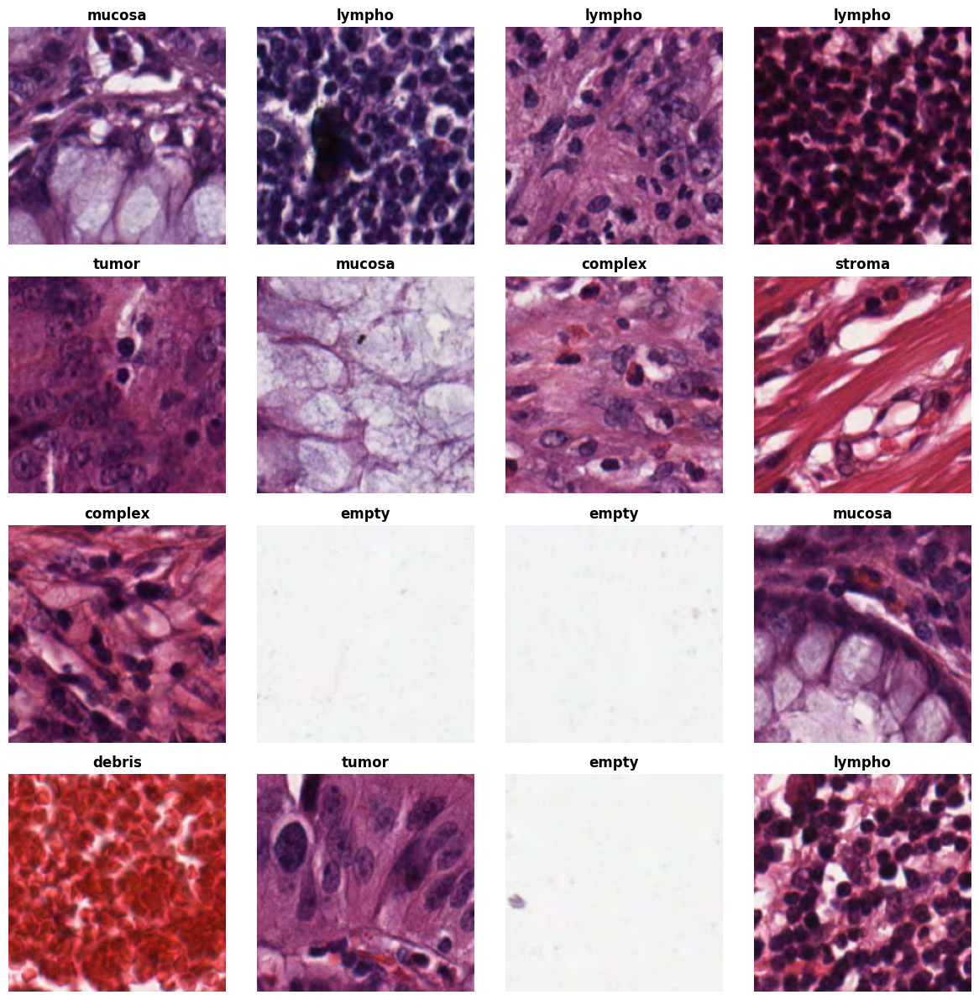

In [ ]:

class_names = ds_info.features['label'].names
images, labels = next(iter(train_loader))
plt.figure(figsize=(12,12))
for i in range(16):
    img = images[i].cpu().numpy().transpose((1,2,0))
    img = (img * 0.5 + 0.5).clip(0,1)
    plt.subplot(4,4,i+1)
    plt.imshow(img)
    plt.title(class_names[labels[i].item()], fontsize=12, fontweight='bold')
    plt.axis("off")

plt.tight_layout()
plt.show()


# Train and Evaluation

In [ ]:

def train_model(model, train_loader, val_loader, epochs=20, lr=3e-4, save_path="best_model.pth"):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    best_val_loss = float('inf')  # initialize best loss to infinity

    for epoch in range(epochs):

        model.train()
        running_loss = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        model.eval()
        val_loss, correct, total = 0, 0, 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        avg_train_loss = running_loss / len(train_loader)
        avg_val_loss = val_loss / len(val_loader)
        val_acc = 100 * correct / total

        print(f"Epoch [{epoch+1}/{epochs}] "
              f"Train Loss: {avg_train_loss:.4f} "
              f"Val Loss: {avg_val_loss:.4f} "
              f"Val Acc: {val_acc:.2f}%")

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), save_path)
            print(f"--> Saved new best model with Val Loss: {best_val_loss:.4f}")



def evaluate_with_report(model, loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Accuracy
    acc = accuracy_score(all_labels, all_preds)
    print(f"Overall Accuracy: {acc:.4f}\n")

    # Classification Report
    report_dict = classification_report(
        all_labels, all_preds, target_names=class_names, digits=4, output_dict=True
    )
    report_text = classification_report(
        all_labels, all_preds, target_names=class_names, digits=4
    )

    print("Classification Report:\n")
    print(report_text)

    return acc, report_dict   # return dictionary instead of text


def evaluate_and_collect(models, model_names, loader, device, class_names):
    results = []

    for model, name in zip(models, model_names):
        print(f"\nEvaluating {name}...")
        acc, report_dict = evaluate_with_report(model, loader, device, class_names)

        f1_macro = report_dict["macro avg"]["f1-score"]

        results.append({
            "Model": name,
            "Accuracy": acc,
            "F1_macro": f1_macro
        })

    # Convert to DataFrame
    df = pd.DataFrame(results)

    # Plot comparison
    plt.figure(figsize=(8,5))
    df.set_index("Model")[["Accuracy", "F1_macro"]].plot(kind="bar")
    plt.title("Model Comparison (Accuracy & F1 Macro)")
    plt.ylabel("Score")
    plt.ylim(0,1)
    plt.xticks(rotation=0)
    plt.legend(loc="lower right")
    plt.show()

    return df


import torch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import math

def plot_confusion_matrices(models, model_names, loader, device, class_names):
    """
    Plots confusion matrices for multiple models in a grid (2 per row)
    with aligned axes so that the diagonal is consistent.
    """
    n_models = len(models)
    n_cols = 2
    n_rows = math.ceil(n_models / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 6*n_rows))
    axes = axes.flatten()  # flatten in case of 1D

    for i, (ax, model, name) in enumerate(zip(axes, models, model_names)):
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for inputs, labels in loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        cm = confusion_matrix(all_labels, all_preds, labels=range(len(class_names)))
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
        disp.plot(ax=ax, cmap="Blues", values_format="d", colorbar=False)

        ax.set_title(name)
        ax.set_xticks(range(len(class_names)))
        ax.set_yticks(range(len(class_names)))
        ax.set_xticklabels(class_names, rotation=45, ha="right")
        ax.set_yticklabels(class_names)


    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# 1_ Build CNN model from scratch

### CNN (From Scratch)
A custom convolutional neural network trained from scratch, consisting of three convolutional blocks with increasing feature depths (32 → 64 → 128), followed by adaptive average pooling and fully connected layers.  
This model is used as a baseline to compare against more advanced architectures such as Attention-based CNNs, Vision Transformers, and Transfer Learning models.

**Results:**
- Epochs: 20  
- Training Loss: 0.6679  
- Validation Loss: 0.7148  
- Validation Accuracy: **68.27%**



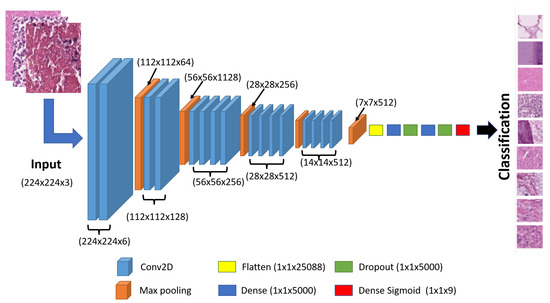

In [ ]:

class Model(nn.Module):
    def __init__(self, num_classes=8):
        super(Model, self).__init__()

        self.conv1_1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv1_2 = nn.Conv2d(32, 32, 3, padding=1)
        self.conv1_3 = nn.Conv2d(32, 32, 3, padding=1)

        self.conv2_1 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv2_2 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv2_3 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv3_1 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv3_2 = nn.Conv2d(128, 128, 3, padding=1)
        self.conv3_3 = nn.Conv2d(128, 128, 3, padding=1)
        self.pool = nn.MaxPool2d(2,2)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc1 = nn.Linear(128*1*1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        # Block 1
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = F.relu(self.conv1_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = F.relu(self.conv2_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = F.relu(self.conv3_3(x))
        x = self.pool(x)
        x = self.dropout(x)
        x = self.adaptive_pool(x)
        x = x.view(x.size(0), -1)  # flatten

        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x


CNNmodel = Model(num_classes=len(class_names)).to(device)


In [ ]:
CNNmodel = Model(num_classes=len(class_names)).to(device)


# 1_Train CNN model

In [ ]:
train_model(CNNmodel, train_loader, val_loader)

Epoch [1/20] Train Loss: 1.7777 Val Loss: 1.4423 Val Acc: 31.87%
--> Saved new best model with Val Loss: 1.4423
Epoch [2/20] Train Loss: 1.4323 Val Loss: 1.3022 Val Acc: 38.13%
--> Saved new best model with Val Loss: 1.3022
Epoch [3/20] Train Loss: 1.2571 Val Loss: 0.9950 Val Acc: 53.20%
--> Saved new best model with Val Loss: 0.9950
Epoch [4/20] Train Loss: 1.0021 Val Loss: 0.9245 Val Acc: 60.40%
--> Saved new best model with Val Loss: 0.9245
Epoch [5/20] Train Loss: 0.9348 Val Loss: 0.8978 Val Acc: 56.80%
--> Saved new best model with Val Loss: 0.8978
Epoch [6/20] Train Loss: 0.9214 Val Loss: 0.8632 Val Acc: 64.00%
--> Saved new best model with Val Loss: 0.8632
Epoch [7/20] Train Loss: 0.8330 Val Loss: 0.8087 Val Acc: 67.73%
--> Saved new best model with Val Loss: 0.8087
Epoch [8/20] Train Loss: 0.7953 Val Loss: 0.8006 Val Acc: 66.93%
--> Saved new best model with Val Loss: 0.8006
Epoch [9/20] Train Loss: 0.8002 Val Loss: 0.6930 Val Acc: 70.13%
--> Saved new best model with Val Loss:

In [ ]:
save_path = "/content/CNNmodel.pth"

torch.save(CNNmodel.state_dict(), save_path)
print(f"Model saved at {save_path}")

Model saved at /content/CNNmodel.pth


# Model 2 : Vision Transformer (ViT)

### 🔹 Vision Transformer (ViT)
A Vision Transformer model that processes images by dividing them into fixed-size patches, which are then linearly embedded and passed through transformer encoder layers using self-attention.  
This approach enables the model to capture long-range global relationships across the entire image, unlike traditional CNNs that focus mainly on local features.

**Results:**
- Epochs: 20  
- Training Loss: 0.0106  
- Validation Loss: 0.1550  
- Validation Accuracy: **95.87%**



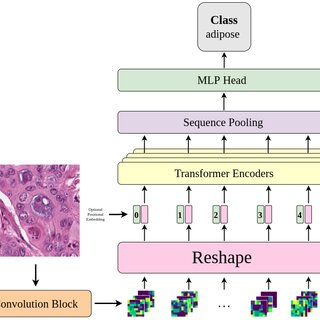

In [ ]:
import timm
model = timm.create_model("vit_tiny_patch16_224",
                         pretrained = True,
                         num_classes = len(class_names))
ViTmodel = model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/22.9M [00:00<?, ?B/s]

In [ ]:
train_model(ViTmodel, train_loader, val_loader)

Epoch [1/20] Train Loss: 0.5186 Val Loss: 0.2828 Val Acc: 90.13%
--> Saved new best model with Val Loss: 0.2828
Epoch [2/20] Train Loss: 0.2004 Val Loss: 0.1634 Val Acc: 94.80%
--> Saved new best model with Val Loss: 0.1634
Epoch [3/20] Train Loss: 0.1288 Val Loss: 0.2012 Val Acc: 93.87%
Epoch [4/20] Train Loss: 0.1049 Val Loss: 0.1333 Val Acc: 95.07%
--> Saved new best model with Val Loss: 0.1333
Epoch [5/20] Train Loss: 0.0420 Val Loss: 0.1863 Val Acc: 94.40%
Epoch [6/20] Train Loss: 0.0599 Val Loss: 0.2036 Val Acc: 94.93%
Epoch [7/20] Train Loss: 0.0888 Val Loss: 0.2199 Val Acc: 94.00%
Epoch [8/20] Train Loss: 0.0955 Val Loss: 0.2265 Val Acc: 93.07%
Epoch [9/20] Train Loss: 0.0382 Val Loss: 0.1900 Val Acc: 94.93%
Epoch [10/20] Train Loss: 0.0186 Val Loss: 0.2277 Val Acc: 94.80%
Epoch [11/20] Train Loss: 0.0277 Val Loss: 0.1746 Val Acc: 95.33%
Epoch [12/20] Train Loss: 0.0209 Val Loss: 0.1755 Val Acc: 95.20%
Epoch [13/20] Train Loss: 0.0344 Val Loss: 0.2724 Val Acc: 94.13%
Epoch [14/

In [ ]:
save_path = "/content/ViTmodel.pth"

torch.save(ViTmodel.state_dict(), save_path)
print(f"Model saved at {save_path}")

Model saved at /content/ViTmodel.pth


**Attention + CNN**

### 🔹 Attention + CNN
A CNN model enhanced with an attention mechanism, which allows the network to focus on the most relevant regions of the image while ignoring less important areas.  
This helps improve feature representation and classification performance compared to a standard CNN.

**Results:**
- Epoch 20/20:  
  - Training Loss: 0.6298  
  - Validation Loss: 0.6508  
  - Validation Accuracy: **72.27%**

  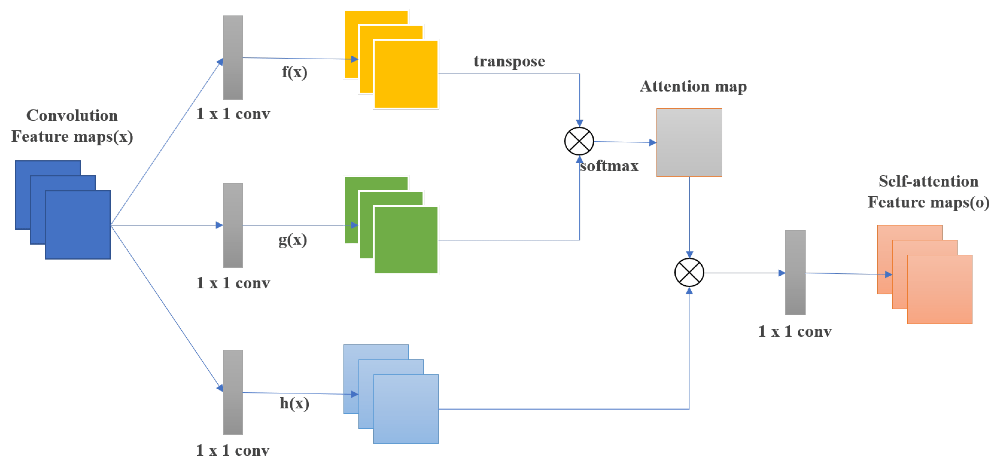


In [ ]:
class SEBlock(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SEBlock, self).__init__()
        self.fc1 = nn.Linear(channel, channel // reduction)
        self.fc2 = nn.Linear(channel // reduction, channel)

    def forward(self, x):
        b, c, _, _ = x.size()
        y = F.adaptive_avg_pool2d(x, 1).view(b, c)
        y = F.relu(self.fc1(y))
        y = torch.sigmoid(self.fc2(y)).view(b, c, 1, 1)
        return x * y.expand_as(x)

class AttentionCNN(nn.Module):
    def __init__(self, num_classes=8):
        super(AttentionCNN, self).__init__()
        # CNN Layers
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.3)

        # SE Attention
        self.se1 = SEBlock(32)
        self.se2 = SEBlock(64)
        self.se3 = SEBlock(128)

        # Adaptive Pool + FC
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc1 = nn.Linear(128, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.se1(x)
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv2(x))
        x = self.se2(x)
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv3(x))
        x = self.se3(x)
        x = self.pool(x)
        x = self.dropout(x)

        x = self.adaptive_pool(x)
        x = x.view(x.size(0), -1)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

AttentionCNNmodel = AttentionCNN(num_classes=len(class_names)).to(device)

In [ ]:
AttentionCNNmodel = Model(num_classes=len(class_names)).to(device)

train_model(
    AttentionCNNmodel,
    train_loader,
    val_loader,
    epochs=20,
    lr=3e-4,
    save_path="best_attention_cnn.pth"
)

Epoch [1/20] Train Loss: 1.7729 Val Loss: 1.3879 Val Acc: 37.47%
--> Saved new best model with Val Loss: 1.3879
Epoch [2/20] Train Loss: 1.2897 Val Loss: 1.1508 Val Acc: 41.73%
--> Saved new best model with Val Loss: 1.1508
Epoch [3/20] Train Loss: 1.0523 Val Loss: 1.0502 Val Acc: 52.53%
--> Saved new best model with Val Loss: 1.0502
Epoch [4/20] Train Loss: 0.9711 Val Loss: 0.9147 Val Acc: 63.73%
--> Saved new best model with Val Loss: 0.9147
Epoch [5/20] Train Loss: 0.9218 Val Loss: 0.8369 Val Acc: 66.67%
--> Saved new best model with Val Loss: 0.8369
Epoch [6/20] Train Loss: 0.9038 Val Loss: 0.8551 Val Acc: 63.87%
Epoch [7/20] Train Loss: 0.8188 Val Loss: 0.7807 Val Acc: 66.93%
--> Saved new best model with Val Loss: 0.7807
Epoch [8/20] Train Loss: 0.8671 Val Loss: 0.9631 Val Acc: 61.33%
Epoch [9/20] Train Loss: 0.8468 Val Loss: 0.7133 Val Acc: 69.47%
--> Saved new best model with Val Loss: 0.7133
Epoch [10/20] Train Loss: 0.7918 Val Loss: 0.8028 Val Acc: 60.40%
Epoch [11/20] Train 

In [ ]:
save_path = "/content/AttentionCNNmodel.pth"

torch.save(AttentionCNNmodel.state_dict(), save_path)
print(f"Model saved at {save_path}")

Model saved at /content/AttentionCNNmodel.pth


**Model 4 : Transfer Learning(resnet50)**

### 🔹 Transfer Learning (ResNet50)
A pretrained ResNet50 model fine-tuned on our dataset.  
The early convolutional layers are frozen to retain general feature extraction, while the later layers are fine-tuned to adapt to our specific classes.

**Results:**
- Epochs: 20  
- Training Loss: 0.2457  
- Validation Loss: 0.2587  
- Validation Accuracy: **92.27%**

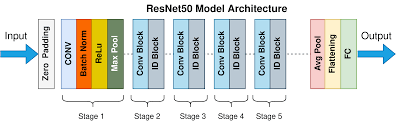

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pretrained ResNet50
model = models.resnet50(pretrained=True)

# Freeze all layers except the final fully connected layer
for param in model.parameters():
    param.requires_grad = False

num_features = model.fc.in_features
model.fc = nn.Linear(num_features, len(class_names))  # 8 classes
TransferLearningmodel = model.to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 191MB/s]


In [ ]:
train_model(TransferLearningmodel, train_loader, val_loader)

Epoch [1/20] Train Loss: 1.3732 Val Loss: 0.9024 Val Acc: 80.13%
--> Saved new best model with Val Loss: 0.9024
Epoch [2/20] Train Loss: 0.7530 Val Loss: 0.6085 Val Acc: 86.93%
--> Saved new best model with Val Loss: 0.6085
Epoch [3/20] Train Loss: 0.5666 Val Loss: 0.4923 Val Acc: 87.07%
--> Saved new best model with Val Loss: 0.4923
Epoch [4/20] Train Loss: 0.4811 Val Loss: 0.4416 Val Acc: 88.13%
--> Saved new best model with Val Loss: 0.4416
Epoch [5/20] Train Loss: 0.4354 Val Loss: 0.3984 Val Acc: 88.27%
--> Saved new best model with Val Loss: 0.3984
Epoch [6/20] Train Loss: 0.4028 Val Loss: 0.3597 Val Acc: 88.93%
--> Saved new best model with Val Loss: 0.3597
Epoch [7/20] Train Loss: 0.3668 Val Loss: 0.3468 Val Acc: 90.40%
--> Saved new best model with Val Loss: 0.3468
Epoch [8/20] Train Loss: 0.3532 Val Loss: 0.3262 Val Acc: 90.27%
--> Saved new best model with Val Loss: 0.3262
Epoch [9/20] Train Loss: 0.3363 Val Loss: 0.3152 Val Acc: 90.13%
--> Saved new best model with Val Loss:

In [ ]:
save_path = "/content/TransferLearningmodelresnet50.pth"

torch.save(TransferLearningmodel.state_dict(), save_path)
print(f"Model saved at {save_path}")

Model saved at /content/TransferLearningmodelresnet50.pth


**Model 5 : Transfer Learning(densenet121)**

### 🔹 Transfer Learning (DenseNet121)
A pretrained DenseNet121 model fine-tuned on our dataset.  
DenseNet uses dense connections between layers, which promotes feature reuse and efficient gradient flow, making it particularly effective for complex image patterns.

**Results:**
- Epochs: 20  
- Training Loss: 0.2741  
- Validation Loss: 0.2711  
- Validation Accuracy: **91.60%**

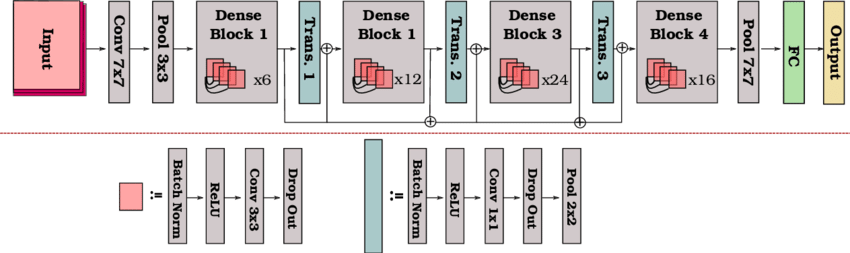

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pretrained DenseNet121
model = models.densenet121(pretrained=True)
for param in model.parameters():
  param.requires_grad = False
num_features = model.classifier.in_features
model.classifier = nn.Linear(num_features, len(class_names))
TransferLearningDenseNet = model.to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 184MB/s]


In [ ]:
train_model(TransferLearningDenseNet, train_loader, val_loader)

Epoch [1/20] Train Loss: 1.6008 Val Loss: 1.2254 Val Acc: 73.20%
--> Saved new best model with Val Loss: 1.2254
Epoch [2/20] Train Loss: 1.0080 Val Loss: 0.8481 Val Acc: 82.53%
--> Saved new best model with Val Loss: 0.8481
Epoch [3/20] Train Loss: 0.7590 Val Loss: 0.6716 Val Acc: 85.47%
--> Saved new best model with Val Loss: 0.6716
Epoch [4/20] Train Loss: 0.6286 Val Loss: 0.5734 Val Acc: 86.80%
--> Saved new best model with Val Loss: 0.5734
Epoch [5/20] Train Loss: 0.5511 Val Loss: 0.5060 Val Acc: 87.07%
--> Saved new best model with Val Loss: 0.5060
Epoch [6/20] Train Loss: 0.4945 Val Loss: 0.4647 Val Acc: 88.00%
--> Saved new best model with Val Loss: 0.4647
Epoch [7/20] Train Loss: 0.4460 Val Loss: 0.4270 Val Acc: 88.93%
--> Saved new best model with Val Loss: 0.4270
Epoch [8/20] Train Loss: 0.4235 Val Loss: 0.3966 Val Acc: 89.33%
--> Saved new best model with Val Loss: 0.3966
Epoch [9/20] Train Loss: 0.3965 Val Loss: 0.3763 Val Acc: 89.60%
--> Saved new best model with Val Loss:

In [ ]:
save_path = "/content/TransferLearningDenseNet .pth"

torch.save(TransferLearningDenseNet .state_dict(), save_path)
print(f"Model saved at {save_path}")

Model saved at /content/TransferLearningDenseNet .pth


**Comparison of Model Performance**


Evaluating ViT...
Overall Accuracy: 0.9587

Classification Report:

              precision    recall  f1-score   support

       tumor     1.0000    0.9880    0.9939        83
      stroma     0.9639    0.9302    0.9467        86
     complex     0.8738    0.9184    0.8955        98
      lympho     0.9082    0.9368    0.9223        95
      debris     0.9802    0.9519    0.9659       104
      mucosa     0.9894    0.9688    0.9789        96
     adipose     0.9775    0.9886    0.9831        88
       empty     0.9900    0.9900    0.9900       100

    accuracy                         0.9587       750
   macro avg     0.9604    0.9591    0.9595       750
weighted avg     0.9597    0.9587    0.9590       750


Evaluating CNN...
Overall Accuracy: 0.6947

Classification Report:

              precision    recall  f1-score   support

       tumor     0.8358    0.6747    0.7467        83
      stroma     0.5315    0.6860    0.5990        86
     complex     0.6822    0.7449    0.7122     

<Figure size 800x500 with 0 Axes>

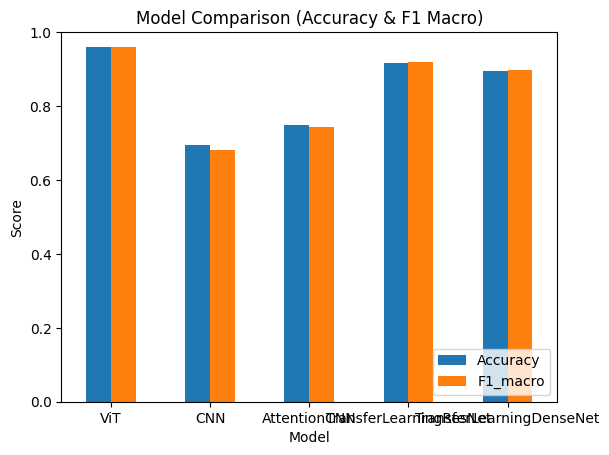

                      Model  Accuracy  F1_macro
0                       ViT  0.958667  0.959542
1                       CNN  0.694667  0.680292
2              AttentionCNN  0.749333  0.742813
3    TransferLearningResNet  0.917333  0.918386
4  TransferLearningDenseNet  0.896000  0.897077


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
models = [ViTmodel, CNNmodel, AttentionCNNmodel, TransferLearningmodel, TransferLearningDenseNet]

model_names = ["ViT", "CNN", "AttentionCNN", "TransferLearningResNet", "TransferLearningDenseNet"]


results_df = evaluate_and_collect(models, model_names, test_loader, device, class_names)
print(results_df)

**Confusion Matrices and Class-wise Loss**

The following figures show **Confusion Matrices** and **Class-wise Loss** for all models.  
Each subplot is labeled with the **model name** for clarity.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix
import numpy as np

def plot_confusion_matrices(models, model_names, test_loader, device, class_names):
    num_models = len(models)
    plt.figure(figsize=(6*num_models, 5))

    for i, (model, name) in enumerate(zip(models, model_names)):
        all_preds = []
        all_labels = []
        model.eval()
        model.to(device)

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs.data, 1)
                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        cm = confusion_matrix(all_labels, all_preds)
        plt.subplot(1, num_models, i+1)
        sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm", xticklabels=class_names, yticklabels=class_names)
        plt.title(f"Confusion Matrix: {name}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")

    plt.tight_layout()
    plt.show()


In [ ]:
def plot_class_loss(models, model_names, test_loader, device, class_names):
    num_models = len(models)
    plt.figure(figsize=(6*num_models, 5))

    for i, (model, name) in enumerate(zip(models, model_names)):
        class_loss = np.zeros(len(class_names))
        class_count = np.zeros(len(class_names))
        model.eval()
        model.to(device)

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = F.cross_entropy(outputs, labels, reduction='none')

                for l, lo in zip(labels, loss):
                    class_loss[l.item()] += lo.item()
                    class_count[l.item()] += 1

        class_loss = class_loss / class_count

        plt.subplot(1, num_models, i+1)
        plt.bar(class_names, class_loss, color=plt.cm.tab20.colors)
        plt.xticks(rotation=45)
        plt.ylabel("Loss")
        plt.title(f"Class Loss: {name}")

    plt.tight_layout()
    plt.show()


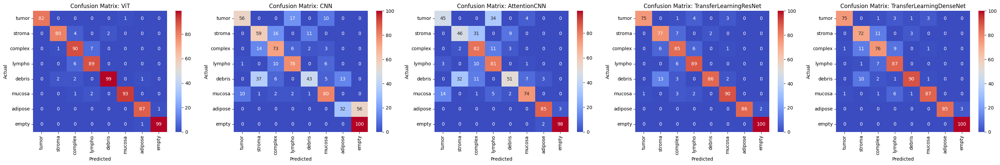

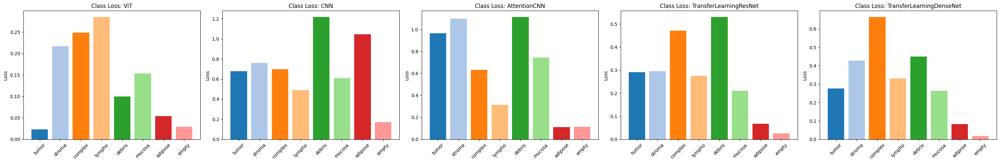

In [ ]:
plot_confusion_matrices(models, model_names, test_loader, device, class_names)


plot_class_loss(models, model_names, test_loader, device, class_names)

**Test**

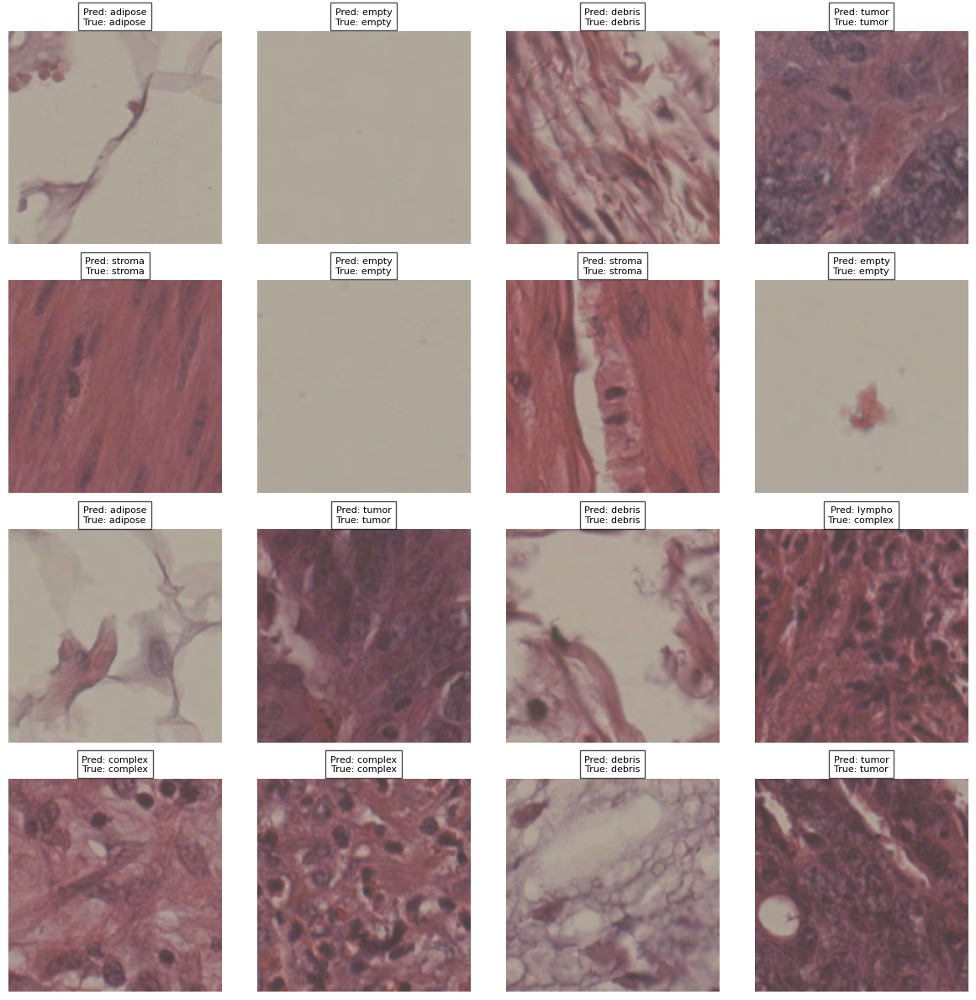

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def imshow_grid(images, labels, preds, class_names, n_rows=4, n_cols=4, normalize=True):

    images = images[:n_rows*n_cols]
    labels = labels[:n_rows*n_cols]
    preds = preds[:n_rows*n_cols]

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
    axes = axes.flatten()

    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])

    for i, ax in enumerate(axes):
        img = images[i].cpu().permute(1, 2, 0).numpy()
        if normalize:
            img = (img * std + mean).clip(0,1)

        true_label = class_names[labels[i].item()]
        pred_label = class_names[preds[i].item()]


        border_color = "green" if labels[i].item() == preds[i].item() else "red"
        for spine in ax.spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(2)

        ax.imshow(img)
        ax.set_title(f"Pred: {pred_label}\nTrue: {true_label}", fontsize=8,
                     bbox=dict(facecolor='white', alpha=0.7))
        ax.axis("off")

    plt.tight_layout()
    plt.show()



images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)


images16, labels16 = images[:16], labels[:16]

model.eval()
with torch.no_grad():
    outputs = model(images16)
    _, preds16 = torch.max(outputs, 1)


imshow_grid(images16, labels16, preds16, class_names, n_rows=4, n_cols=4)


**Classification Results: Sample Images with Predicted Probabilities**

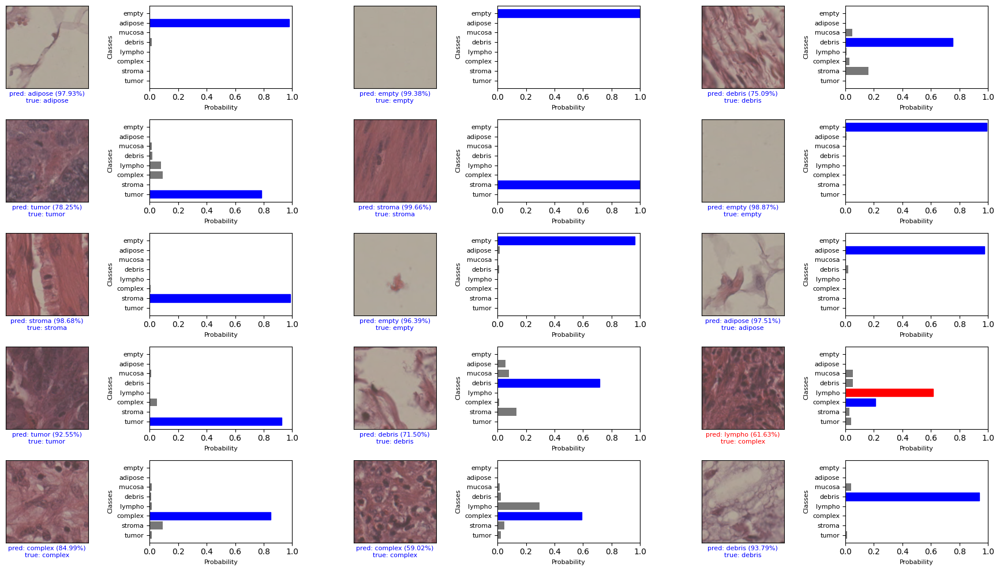

In [ ]:
def plot_classification(i, labels_array, ps_darray, classes):
    thisplot = plt.barh(np.arange(len(classes)), ps_darray[i], color='#777777')
    plt.yticks(np.arange(len(classes)), classes, fontsize=8)
    plt.xlim(0,1)
    plt.xlabel('Probability', fontsize=8)
    plt.ylabel('Classes', fontsize=8)
    pred = np.argmax(ps_darray[i])
    thisplot[pred].set_color('red')
    thisplot[labels_array[i]].set_color('blue')


def plot_image_from_tensor(i, images, labels_array, ps_darray, classes, normalize=True):
    img = images[i].cpu().permute(1,2,0).numpy()
    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std  = np.array([0.229, 0.224, 0.225])
        img = (img * std + mean).clip(0,1)

    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

    pred = np.argmax(ps_darray[i])
    color = 'blue' if pred == labels_array[i] else 'red'
    plt.xlabel('pred: {} ({:.2f}%)\ntrue: {}'.format(
        classes[pred], np.max(ps_darray[i])*100, classes[labels_array[i]]), color=color, fontsize=8)


images, labels = next(iter(test_loader))
images = images.to(device)
labels_array = labels.cpu().numpy().squeeze()


model.eval()
with torch.no_grad():
    output = model(images)
    ps = F.softmax(output, dim=1)
    ps_darray = ps.cpu().numpy().squeeze()


num_rows = 5
num_cols = 3
plt.figure(figsize=(6*num_cols, 2*num_rows))

for i in range(num_rows*num_cols):

    plt.subplot(num_rows, num_cols*2, 2*i+1)
    plot_image_from_tensor(i, images, labels_array, ps_darray, class_names)


    plt.subplot(num_rows, num_cols*2, 2*i+2)
    plot_classification(i, labels_array, ps_darray, class_names)

plt.tight_layout()
plt.show()

**Summary of models**

In [ ]:
models_dict = {
    "ViT": ViTmodel,
    "CNN": CNNmodel,
    "AttentionCNN": AttentionCNNmodel,
    "TransferLearningResNet": TransferLearningmodel,
    "TransferLearningDenseNet": TransferLearningDenseNet
}


In [ ]:
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score

def per_class_accuracy(model, loader, device, class_names):
    model.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    results = {}

    # Per-class accuracy
    for i, class_name in enumerate(class_names):
        idx = all_labels == i
        results[class_name] = accuracy_score(
            all_labels[idx],
            all_preds[idx]
        )

    # Total accuracy
    results["total_acc"] = accuracy_score(all_labels, all_preds)

    return results


In [ ]:
comparison_dict = {}

for name, model in models_dict.items():
    comparison_dict[name] = per_class_accuracy(
        model,
        test_loader,
        device,
        class_names
    )

results_df = pd.DataFrame(comparison_dict)
results_df.index.name = "category"

print(results_df)


                ViT       CNN  AttentionCNN  TransferLearningResNet  \
category                                                              
tumor      0.987952  0.674699      0.542169                0.903614   
stroma     0.930233  0.686047      0.534884                0.895349   
complex    0.918367  0.744898      0.836735                0.867347   
lympho     0.936842  0.821053      0.852632                0.936842   
debris     0.951923  0.413462      0.490385                0.826923   
mucosa     0.968750  0.833333      0.770833                0.937500   
adipose    0.988636  0.363636      0.965909                0.977273   
empty      0.990000  1.000000      0.980000                1.000000   
total_acc  0.958667  0.694667      0.749333                0.917333   

           TransferLearningDenseNet  
category                             
tumor                      0.903614  
stroma                     0.837209  
complex                    0.775510  
lympho                     0

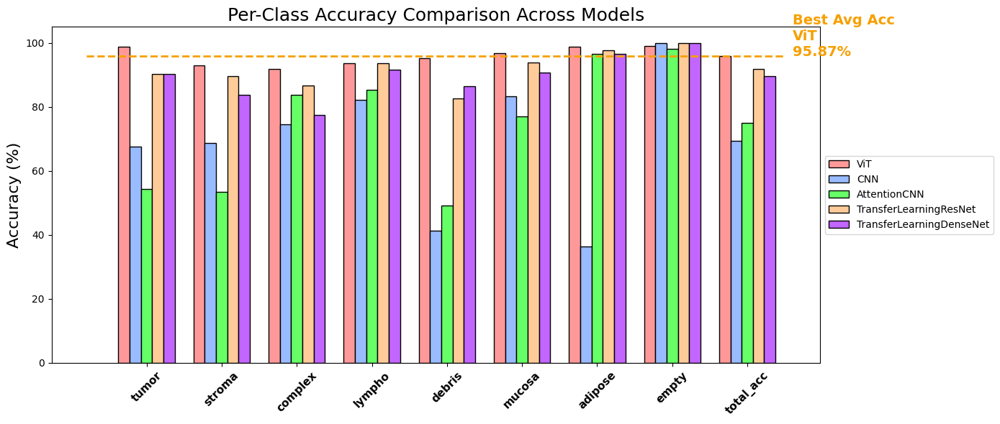

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare data
acc_summary = results_df.copy()

models = acc_summary.columns.values
categories = acc_summary.index.values

num_models = len(models)
num_classes = len(categories)

barWidth = 0.15

colors = [
    '#ff9999',   # ViT
    '#99bbff',   # CNN
    '#66ff66',   # AttentionCNN
    '#ffcc99',   # TL ResNet
    '#c266ff'    # TL DenseNet
]

# Best model (based on total accuracy)
best_model = acc_summary.loc['total_acc'].idxmax()
threshold = acc_summary.loc['total_acc', best_model]

fig, ax = plt.subplots(figsize=(14, 6))

x = np.arange(num_classes)

for i, model in enumerate(models):
    plt.bar(
        x + barWidth*i,
        acc_summary[model] * 100,
        width=barWidth,
        color=colors[i],
        edgecolor='black',
        label=model
    )

# X-axis
plt.xticks(
    x + barWidth*(num_models/2 - 0.5),
    categories,
    rotation=45,
    fontsize=11,
    fontweight='bold'
)

# Labels & title
plt.ylabel('Accuracy (%)', fontsize=16)
plt.title('Per-Class Accuracy Comparison Across Models', fontsize=18)

# Horizontal line for best avg accuracy
ax.plot(
    [-0.5, num_classes-0.2],
    [threshold*100, threshold*100],
    linestyle='--',
    linewidth=2,
    color='#f6a000'
)


ax.text(
    num_classes-0.1,
    threshold*100,
    f'Best Avg Acc\n{best_model}\n{threshold*100:.2f}%',
    fontsize=14,
    fontweight='bold',
    color='#f6a000'
)
# Legend
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()
